**Clone Ultralytics**

This notebook creates a YOLO11n-seg + CBAM Attention experiment. It follows the same workflow as the SimAM/CA/ECA notebooks: clone → patch module → create YAML → test build → train → val → predict → export.

In [1]:
from pathlib import Path
import subprocess
import sys
import os

os.chdir("/content")

ULTRA_DIR = Path("/content/ultralytics")

if not ULTRA_DIR.exists():
    subprocess.run(
        ["git", "clone", "https://github.com/ultralytics/ultralytics.git", str(ULTRA_DIR)],
        check=True
    )
else:
    print("Ultralytics already exists:", ULTRA_DIR)

print("Done:", ULTRA_DIR)

Done: /content/ultralytics


**Add CBAM Attention**

This cell patches local Ultralytics source code to register `CBAMAttention` as a YAML module. CBAM combines channel attention and spatial attention, and this notebook inserts it before the Segment head for P3, P4, and P5 features.

In [2]:
from pathlib import Path

ULTRA_DIR = Path("/content/ultralytics")
conv_py = ULTRA_DIR / "ultralytics/nn/modules/conv.py"
init_py = ULTRA_DIR / "ultralytics/nn/modules/__init__.py"
tasks_py = ULTRA_DIR / "ultralytics/nn/tasks.py"

# Backup before patch
for p in [conv_py, init_py, tasks_py]:
    backup = p.with_suffix(p.suffix + ".bak_cbam_fixed")
    if not backup.exists():
        backup.write_text(p.read_text())
        print("Backup created:", backup)

cbam_code = r'''

class CBAMAttention(nn.Module):
    """
    CBAM: Convolutional Block Attention Module for YOLO/Ultralytics.

    This implementation preserves the input feature shape by default and is designed
    to be compatible with Ultralytics YAML parsing.

    Args:
        c1 (int): input channels.
        c2 (int, optional): output channels. If None, c2 = c1.
        reduction (int): channel attention reduction ratio.
        kernel_size (int): spatial attention convolution kernel size, usually 7.
    """

    def __init__(self, c1, c2=None, reduction=16, kernel_size=7):
        super().__init__()
        c2 = c1 if c2 is None else c2
        hidden = max(c1 // reduction, 1)

        # Channel Attention: shared MLP implemented with 1x1 convolutions.
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.mlp = nn.Sequential(
            nn.Conv2d(c1, hidden, kernel_size=1, bias=False),
            nn.ReLU(inplace=True),
            nn.Conv2d(hidden, c1, kernel_size=1, bias=False),
        )

        self.channel_sigmoid = nn.Sigmoid()

        # Spatial Attention: 2-channel descriptor -> 1 attention map.
        assert kernel_size in (3, 7), "CBAM spatial kernel_size should be 3 or 7"
        padding = 3 if kernel_size == 7 else 1

        self.spatial_conv = nn.Conv2d(
            2,
            1,
            kernel_size=kernel_size,
            padding=padding,
            bias=False
        )

        self.spatial_sigmoid = nn.Sigmoid()

        self.proj = None
        if c1 != c2:
            self.proj = nn.Conv2d(c1, c2, kernel_size=1, stride=1, padding=0, bias=False)

    def forward(self, x):
        # Channel attention.
        ca = self.mlp(self.avg_pool(x)) + self.mlp(self.max_pool(x))
        x = x * self.channel_sigmoid(ca)

        # Spatial attention.
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        sa = torch.cat([avg_out, max_out], dim=1)
        x = x * self.spatial_sigmoid(self.spatial_conv(sa))

        if self.proj is not None:
            x = self.proj(x)

        return x
'''

# =========================================================
# 1. Patch conv.py
# =========================================================
text = conv_py.read_text()

# Ensure imports exist
if "import torch\n" not in text:
    if "import math\n" in text:
        text = text.replace("import math\n", "import math\nimport torch\n")
    else:
        text = "import torch\n" + text

if "import torch.nn as nn\n" not in text and "from torch import nn\n" not in text:
    text = text.replace("import torch\n", "import torch\nimport torch.nn as nn\n")

# Add CBAMAttention to conv.py __all__
if '"CBAMAttention",' not in text:
    if '"Concat",' in text:
        text = text.replace(
            '"Concat",',
            '"Concat",\n    "CBAMAttention",'
        )
    else:
        print("WARNING: Could not find __all__ insertion point for CBAMAttention in conv.py")

# Add CBAMAttention class
if "class CBAMAttention(nn.Module):" not in text:
    text = text.rstrip() + cbam_code + "\n"

conv_py.write_text(text)
print("Patched conv.py with CBAMAttention")


# =========================================================
# 2. Patch __init__.py
# =========================================================
text = init_py.read_text()

# Add CBAMAttention to from .conv import (...)
if "from .conv import (" in text:
    conv_import_block = text.split("from .conv import (", 1)[1].split(")", 1)[0]

    if "CBAMAttention" not in conv_import_block:
        if "    Concat," in text:
            text = text.replace(
                "    Concat,",
                "    Concat,\n    CBAMAttention,"
            )
        else:
            text = text.replace(
                "from .conv import (",
                "from .conv import (\n    CBAMAttention,"
            )
else:
    if "from .conv import CBAMAttention" not in text:
        text += "\nfrom .conv import CBAMAttention\n"

# Add CBAMAttention to __all__
if "__all__" in text:
    all_block = text.split("__all__", 1)[1]

    if '"CBAMAttention"' not in all_block:
        if '"Concat",' in text:
            text = text.replace(
                '"Concat",',
                '"Concat",\n    "CBAMAttention",'
            )
        else:
            print("WARNING: Could not find __all__ insertion point for CBAMAttention in __init__.py")

init_py.write_text(text)
print("Patched __init__.py")


# =========================================================
# 3. Patch tasks.py imports
# =========================================================
text = tasks_py.read_text()

# Add CBAMAttention to import block
if "from ultralytics.nn.modules import (" in text:
    modules_import_block = text.split("from ultralytics.nn.modules import (", 1)[1].split(")", 1)[0]

    if "CBAMAttention" not in modules_import_block:
        if "    Concat," in text:
            text = text.replace(
                "    Concat,",
                "    Concat,\n    CBAMAttention,"
            )
        else:
            text = text.replace(
                "from ultralytics.nn.modules import (",
                "from ultralytics.nn.modules import (\n    CBAMAttention,"
            )

# =========================================================
# 4. Register CBAMAttention as base_modules robustly
# =========================================================
# CBAMAttention SHOULD be in base_modules because its YAML format is:
# - [16, 1, CBAMAttention, [256, 16, 7]]
#
# After base_modules parsing:
# c1 = ch[f]
# c2 = make_divisible(256 * width, 8)
# args = [c1, c2, 16, 7]
#
# With YOLO11n width=0.25:
# 256 -> 64, 512 -> 128, 1024 -> 256

base_start = text.find("base_modules = frozenset")
repeat_start = text.find("repeat_modules = frozenset", base_start)

if base_start == -1 or repeat_start == -1:
    raise RuntimeError("Could not locate base_modules block in tasks.py")

base_block = text[base_start:repeat_start]

if "CBAMAttention" not in base_block:
    # Pattern used by current Ultralytics:
    # base_modules = frozenset(
    #     {
    pattern1 = "base_modules = frozenset(\n        {"

    # Pattern used by some older/custom versions:
    pattern2 = "base_modules = frozenset({"

    if pattern1 in text:
        text = text.replace(
            pattern1,
            "base_modules = frozenset(\n        {\n            CBAMAttention,"
        )
        print("Added CBAMAttention to base_modules using pattern1")

    elif pattern2 in text:
        text = text.replace(
            pattern2,
            "base_modules = frozenset({\n            CBAMAttention,"
        )
        print("Added CBAMAttention to base_modules using pattern2")

    else:
        raise RuntimeError(
            "Could not insert CBAMAttention into base_modules. "
            "Please inspect the base_modules format in tasks.py."
        )
else:
    print("CBAMAttention already exists in base_modules")

tasks_py.write_text(text)
print("Patched tasks.py")

print("\nCBAMAttention registration complete.")
print("IMPORTANT: Restart runtime/kernel before running YOLO(MODEL_YAML).")

Backup created: /content/ultralytics/ultralytics/nn/modules/conv.py.bak_cbam_fixed
Backup created: /content/ultralytics/ultralytics/nn/modules/__init__.py.bak_cbam_fixed
Backup created: /content/ultralytics/ultralytics/nn/tasks.py.bak_cbam_fixed
Patched conv.py with CBAMAttention
Patched __init__.py
Added CBAMAttention to base_modules using pattern1
Patched tasks.py

CBAMAttention registration complete.
IMPORTANT: Restart runtime/kernel before running YOLO(MODEL_YAML).


**Create YAML YOLO11n-seg + CBAM Attention**

CBAM is inserted on the 3 feature maps P3, P4, P5 immediately before the `Segment` head. For YOLO11n scale, `[256, 16, 7]`, `[512, 16, 7]`, `[1024, 16, 7]` are automatically width-scaled by Ultralytics. The last two values are the CBAM reduction ratio and spatial kernel size.

In [3]:
from pathlib import Path

yaml_path = Path("/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-head.yaml")

yaml_text = """
nc: 2
scales:
  n: [0.50, 0.25, 1024]
  s: [0.50, 0.50, 1024]
  m: [0.50, 1.00, 512]
  l: [1.00, 1.00, 512]
  x: [1.00, 1.50, 512]

backbone:
  - [-1, 1, Conv, [64, 3, 2]]
  - [-1, 1, Conv, [128, 3, 2]]
  - [-1, 2, C3k2, [256, False, 0.25]]
  - [-1, 1, Conv, [256, 3, 2]]
  - [-1, 2, C3k2, [512, False, 0.25]]
  - [-1, 1, Conv, [512, 3, 2]]
  - [-1, 2, C3k2, [512, True]]
  - [-1, 1, Conv, [1024, 3, 2]]
  - [-1, 2, C3k2, [1024, True]]
  - [-1, 1, SPPF, [1024, 5]]
  - [-1, 2, C2PSA, [1024]]

head:
  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 6], 1, Concat, [1]]
  - [-1, 2, C3k2, [512, False]]

  - [-1, 1, nn.Upsample, [None, 2, "nearest"]]
  - [[-1, 4], 1, Concat, [1]]
  - [-1, 2, C3k2, [256, False]]

  - [-1, 1, Conv, [256, 3, 2]]
  - [[-1, 13], 1, Concat, [1]]
  - [-1, 2, C3k2, [512, False]]

  - [-1, 1, Conv, [512, 3, 2]]
  - [[-1, 10], 1, Concat, [1]]
  - [-1, 2, C3k2, [1024, True]]

  # CBAM Attention inserted before Segment head for P3, P4, P5 features.
  # Args: [base_channels, reduction, spatial_kernel_size]. base_channels will be width-scaled for YOLO11n.
  - [16, 1, CBAMAttention, [256, 16, 7]]
  - [19, 1, CBAMAttention, [512, 16, 7]]
  - [22, 1, CBAMAttention, [1024, 16, 7]]
  - [[23, 24, 25], 1, Segment, [nc, 32, 256]]
"""

yaml_path.write_text(yaml_text)
print("Created:", yaml_path)


Created: /content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-head.yaml


**Install Ultralytics local**

In [4]:
import subprocess
import sys

subprocess.run([sys.executable, "-m", "pip", "install", "-q", "-e", "/content/ultralytics"], check=True)
print("Installed local Ultralytics")

Installed local Ultralytics


**Test build model**

In [5]:
import sys
from pathlib import Path

sys.path.insert(0, "/content/ultralytics")

from ultralytics import YOLO

MODEL_YAML = "/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-head.yaml"

model = YOLO(MODEL_YAML)
model.info(verbose=True)

print("Build OK")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
YOLO11n-seg-cbam-head summary: 228 layers, 2,854,044 parameters, 2,854,028 gradients, 9.7 GFLOPs
Build OK


**Install Dataset**

In [6]:
import importlib.util
import subprocess
import sys
import os
import random
import shutil
from pathlib import Path

if importlib.util.find_spec("roboflow") is None:
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "roboflow"], check=True)

import yaml
from roboflow import Roboflow
from google.colab import userdata

SEED = 42
random.seed(SEED)

api_key = userdata.get("ROBOFLOW_API_KEY")
if not api_key:
    raise RuntimeError("Bạn chưa tạo Colab Secret tên ROBOFLOW_API_KEY")

rf = Roboflow(api_key=api_key)

project = rf.workspace("shirmpdiseasedtection").project("ewu_shrimp_disease")
version = project.version(1)

DATASET_DIR = Path("/content/ewu_shrimp_disease-1")

if not (DATASET_DIR / "data.yaml").exists():
    dataset = version.download("yolo26", location=str(DATASET_DIR))
else:
    print("Dataset already exists:", DATASET_DIR)

train_path = DATASET_DIR / "train"
IMAGE_EXTENSIONS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

for split in ["valid", "test"]:
    for sub in ["images", "labels"]:
        (DATASET_DIR / split / sub).mkdir(parents=True, exist_ok=True)

valid_images_dir = DATASET_DIR / "valid/images"
test_images_dir = DATASET_DIR / "test/images"

if not any(valid_images_dir.glob("*")) and not any(test_images_dir.glob("*")):
    image_files = [
        f.name for f in (train_path / "images").iterdir()
        if f.suffix.lower() in IMAGE_EXTENSIONS
    ]

    random.shuffle(image_files)

    train_count = int(0.8 * len(image_files))
    val_count = int(0.1 * len(image_files))

    val_files = image_files[train_count:train_count + val_count]
    test_files = image_files[train_count + val_count:]

    def move_files(files, target_split):
        for f in files:
            shutil.move(
                str(train_path / "images" / f),
                str(DATASET_DIR / target_split / "images" / f)
            )

            label_f = f.rsplit(".", 1)[0] + ".txt"
            label_src = train_path / "labels" / label_f
            label_dst = DATASET_DIR / target_split / "labels" / label_f

            if label_src.exists():
                shutil.move(str(label_src), str(label_dst))
            else:
                label_dst.write_text("")

    move_files(val_files, "valid")
    move_files(test_files, "test")

    print(
        f"Split complete: "
        f"{len(image_files) - len(val_files) - len(test_files)} train, "
        f"{len(val_files)} val, "
        f"{len(test_files)} test"
    )
else:
    print("Existing valid/test split detected")

DATA_YAML = DATASET_DIR / "data.yaml"

with open(DATA_YAML, "r") as f:
    data_config = yaml.safe_load(f)

data_config["train"] = str(DATASET_DIR / "train/images")
data_config["val"] = str(DATASET_DIR / "valid/images")
data_config["test"] = str(DATASET_DIR / "test/images")

with open(DATA_YAML, "w") as f:
    yaml.safe_dump(data_config, f, sort_keys=False)

print("DATA_YAML:", DATA_YAML)
print("Classes:", data_config.get("names"))

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/ewu_shrimp_disease-1 in yolo26:: 100%|██████████| 2255/2255 [00:02<00:00, 787.80it/s]

Split complete: 900 train, 112 val, 114 test
DATA_YAML: /content/ewu_shrimp_disease-1/data.yaml
Classes: ['blackgill', 'whitespot']


**Training model YOLO11n with ECBAM Attention at Head**

In [7]:
from ultralytics import YOLO

MODEL_YAML = "/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-head.yaml"
DATA_YAML = "/content/ewu_shrimp_disease-1/data.yaml"

model = YOLO(MODEL_YAML)

try:
    model.load("yolo11n-seg.pt")
    print("Loaded pretrained yolo11n-seg.pt")
except Exception as e:
    print("Load pretrained warning:", e)

results = model.train(
    data=DATA_YAML,
    epochs=100,
    imgsz=640,
    batch=8,
    device=0,
    workers=2,
    project="/content/runs/shrimp_yolo11n_seg_cbam",
    name="yolo11n_seg_cbam_head",
    pretrained=True,
    optimizer="AdamW",
    lr0=0.001,
    cos_lr=True,
    patience=30,
    close_mosaic=10,
    mask_ratio=4,
    overlap_mask=True,
)

Transferred 378/570 items from pretrained weights
Loaded pretrained yolo11n-seg.pt
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/ewu_shrimp_disease-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/ultralytics/ultralytics/cfg/models/11/yolo11n-seg-cbam-head.yaml,

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      1/100      1.52G      3.777      4.921      4.152      3.219          0          4        640: 100% ━━━━━━━━━━━━ 113/113 1.9it/s 1:00
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.4it/s 5.2s
                   all        112        109          0          0          0          0          0          0          0          0

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      2/100      1.82G      3.589      4.928      3.128      2.963          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      2/100      1.83G      3.257      4.324      3.069      2.731          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109      0.523      0.124     0.0262     0.0073      0.521      0.109     0.0223    0.00346

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      3/100      1.83G      3.318      4.167      2.764      2.612          0          8        640: 1% ──────────── 1/113 1.8it/s 0.4s<1:01

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      3/100      1.83G      3.113       4.21      2.987      2.581          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.6it/s 2.7s
                   all        112        109      0.536     0.0792     0.0193    0.00427       0.54     0.0693     0.0219    0.00379

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      4/100      1.83G      2.617      3.697      2.853       2.36          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      4/100      1.83G      3.037      4.131      2.899      2.487          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.1it/s 3.3s
                   all        112        109      0.535      0.119     0.0494     0.0106      0.528     0.0941     0.0249    0.00575

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      5/100      1.83G       3.16      4.456      2.882      2.486          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      5/100      1.83G      2.913      4.147      2.979       2.44          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.2it/s 3.2s
                   all        112        109      0.258     0.0773       0.11     0.0305      0.158     0.0675     0.0823     0.0104

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      6/100      1.83G      3.256      4.873      2.738      2.409          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      6/100      1.83G      2.885      4.185      2.937      2.416          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109     0.0723      0.076      0.152     0.0399      0.571     0.0347     0.0928     0.0192

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      7/100      1.83G      2.683      3.635      2.765       2.41          0          8        640: 0% ──────────── 0/113  0.5s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      7/100      1.83G      2.879      4.131      2.931      2.366          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109     0.0723      0.124     0.0716     0.0219     0.0704     0.0842     0.0516     0.0121

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      8/100      1.83G      2.882      4.411      2.982      2.213          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      8/100      1.83G      2.818      4.058      2.839      2.323          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.546      0.134      0.215      0.039       0.54      0.104      0.111      0.019

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
      9/100      1.83G      2.431      3.659      2.593      2.229          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


      9/100      1.83G      2.751      4.028      2.963      2.279          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.3s
                   all        112        109      0.562     0.0693     0.0817     0.0222      0.285      0.155      0.114     0.0202

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     10/100      1.83G      2.787      4.354      2.415      2.142          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     10/100      1.83G      2.685      3.959      2.856      2.275          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109       0.18      0.152      0.128     0.0343      0.158      0.127      0.112     0.0226

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     11/100      1.83G      2.665      4.043      2.562      2.304          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     11/100      1.83G       2.77      4.034      2.832      2.269          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 1.9s
                   all        112        109      0.163      0.191     0.0726     0.0218     0.0788      0.109     0.0529     0.0114

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     12/100      1.83G      2.679       3.98      2.742       2.35          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     12/100      1.83G      2.713      4.059      2.921      2.294          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.3s
                   all        112        109      0.281      0.175      0.163     0.0371      0.279       0.17      0.134     0.0281

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     13/100      1.83G      3.048      4.521      3.115      2.713          0          8        640: 1% ──────────── 1/113 1.8it/s 0.3s<1:01

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     13/100      1.83G      2.699      4.023      2.779      2.227          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.2s
                   all        112        109      0.175      0.137      0.135     0.0358      0.156      0.137       0.12     0.0188

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     14/100      1.83G      2.363      3.395      2.437      2.202          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     14/100      1.83G      2.631      3.975      2.764      2.217          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.6it/s 2.6s
                   all        112        109      0.676      0.119      0.101     0.0297      0.644     0.0941     0.0781     0.0158

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     15/100      1.83G       2.63      3.521      2.839      2.311          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     15/100      1.83G       2.64      3.992      2.734      2.227          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.3it/s 1.6s
                   all        112        109      0.537      0.228      0.204     0.0697      0.603      0.104      0.122     0.0336

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     16/100      1.83G      2.536      4.189      2.533      2.411          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     16/100      1.83G      2.631      4.006      2.768      2.229          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.8it/s 1.8s
                   all        112        109      0.244       0.16      0.123     0.0276      0.172      0.169      0.062     0.0133

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     17/100      1.83G      2.487      3.979      2.808      2.241          0          8        640: 1% ──────────── 1/113 1.6it/s 0.4s<1:11

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     17/100      1.83G      2.599      3.934       2.69      2.204          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.435       0.25      0.222     0.0747      0.423      0.244      0.175     0.0511

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     18/100      1.83G      2.163      3.511      2.563       1.95          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     18/100      1.83G      2.605      3.983      2.671      2.186          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.2s
                   all        112        109      0.344      0.188      0.266     0.0939      0.303      0.179      0.166     0.0478

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     19/100      1.83G       2.62       4.05      2.385      2.081          0          8        640: 1% ──────────── 1/113 1.8it/s 0.4s<1:02

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     19/100      1.83G      2.532      3.907      2.587      2.126          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109      0.205      0.153      0.165     0.0432      0.184      0.244     0.0891      0.021

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     20/100      1.83G      2.366      3.981      2.501      2.019          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     20/100      1.83G      2.573      3.971      2.672      2.152          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.184      0.249      0.139     0.0501      0.357      0.107      0.138       0.03

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     21/100      1.83G      2.919      3.972      2.493      2.391          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     21/100      1.83G      2.545      3.871      2.635      2.096          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.6it/s 2.7s
                   all        112        109      0.351      0.201      0.133      0.037       0.63      0.114     0.0815     0.0189

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     22/100      1.83G       2.79      6.067      5.267      2.143          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     22/100      1.83G      2.537      3.948      2.657      2.138          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.1s
                   all        112        109      0.219      0.244       0.18     0.0502      0.171      0.152     0.0867     0.0188

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     23/100      1.83G      2.153      3.929      2.673      2.502          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     23/100      1.83G      2.488      3.918      2.668      2.113          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.219      0.278       0.13     0.0328      0.146      0.201     0.0823     0.0171

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     24/100      1.83G      2.758      3.995      2.225      2.356          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     24/100      1.83G      2.549      3.878      2.558      2.116          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.1s
                   all        112        109      0.328      0.293      0.219     0.0692      0.222      0.239      0.138      0.038

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     25/100      1.83G      2.791      4.174      2.642      2.563          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     25/100      1.83G      2.516      3.905      2.583      2.128          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.327      0.232      0.223     0.0726      0.733      0.192      0.237     0.0668

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     26/100      1.83G      2.553      3.864      2.352      2.078          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     26/100      1.83G      2.544      3.879      2.588      2.113          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109      0.283        0.3      0.197     0.0669      0.241      0.291      0.175     0.0569

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     27/100      1.83G       2.37       3.77      1.997      2.037          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     27/100      1.83G      2.497      3.924      2.592      2.091          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.3it/s 1.6s
                   all        112        109      0.376      0.214      0.253     0.0833        0.3      0.244      0.173     0.0537

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     28/100      1.83G      2.131      3.268      2.159      1.936          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     28/100      1.83G      2.414      3.778       2.45      2.102          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.6it/s 2.6s
                   all        112        109      0.225      0.259      0.246     0.0617      0.261      0.256      0.232     0.0657

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     29/100      1.83G          3      4.419       2.61      2.171          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     29/100      1.83G      2.491      3.861      2.602      2.103          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.359      0.234       0.24      0.123      0.332      0.224      0.218     0.0668

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     30/100      1.83G      2.386      3.957      2.357       2.04          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     30/100      1.83G      2.474      3.834      2.496      2.094          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109      0.352      0.272       0.25      0.104      0.337      0.262      0.221     0.0657

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     31/100      1.83G      2.097      4.029      2.562      1.828          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     31/100      1.83G      2.453      3.858      2.548      2.108          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.273      0.339      0.246      0.119      0.355      0.242      0.231     0.0792

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     32/100      1.83G      2.522      3.574      2.588      2.141          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     32/100      1.83G      2.448      3.895      2.577       2.06          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.1it/s 1.7s
                   all        112        109      0.417      0.192      0.208     0.0888      0.417      0.192      0.196     0.0454

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     33/100      1.83G      2.725      3.929      2.502      2.074          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     33/100      1.83G      2.463      3.839      2.549      2.076          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 32.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.943      0.125      0.218      0.074      0.145      0.219      0.131     0.0378

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     34/100      1.83G      2.797      3.612       2.13       2.19          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     34/100      1.83G      2.391      3.792      2.494      2.064          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.442      0.282      0.266      0.112      0.391      0.236       0.22     0.0695

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     35/100      1.83G      2.035      3.348       2.64      1.809          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     35/100      1.83G      2.405      3.817      2.426      2.049          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.1it/s 1.7s
                   all        112        109       0.24      0.321      0.231      0.102      0.286      0.282      0.191     0.0556

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     36/100      1.83G      2.277      3.998      2.822      1.994          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     36/100      1.83G      2.378      3.757      2.548      1.992          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.522      0.272      0.272      0.112      0.462      0.257      0.228     0.0682

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     37/100      1.83G      3.017      3.209      2.307      2.585          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     37/100      1.83G      2.403      3.753      2.448       2.02          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.6it/s 1.5s
                   all        112        109      0.235      0.209      0.183     0.0666      0.227      0.204      0.181     0.0602

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     38/100      1.83G      2.313      3.997      2.412      1.888          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     38/100      1.83G      2.365      3.751       2.46       2.03          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.8it/s 2.5s
                   all        112        109      0.366      0.326      0.292      0.119      0.357      0.311      0.266     0.0796

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     39/100      1.83G      2.169      4.027      2.398       2.01          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     39/100      1.83G      2.393      3.761      2.392      2.015          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.5it/s 2.7s
                   all        112        109      0.242      0.316      0.262     0.0903      0.261      0.277      0.233     0.0652

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     40/100      1.83G      2.754      3.726        2.7      2.067          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     40/100      1.83G      2.359      3.711      2.487      1.989          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        112        109      0.681       0.25      0.276      0.115      0.815      0.216       0.31     0.0824

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     41/100      1.83G      2.311      4.566      2.646       1.94          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     41/100      1.83G      2.372      3.714      2.539      1.997          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.3it/s 1.6s
                   all        112        109       0.39      0.306      0.323      0.159      0.365      0.297      0.297     0.0949

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     42/100      1.83G      2.983      4.048      2.494      2.093          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     42/100      1.83G      2.387      3.692      2.439      2.016          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109      0.729      0.188      0.292      0.134      0.716      0.188        0.3      0.101

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     43/100      1.83G      2.386       3.09      2.255      1.994          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     43/100      1.83G      2.302      3.728      2.332      1.997          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.327      0.288      0.236       0.11      0.317       0.27      0.219     0.0736

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     44/100      1.83G       2.12       3.25      2.406      1.678          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     44/100      1.83G      2.339      3.587      2.401      1.988          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.237      0.369       0.27      0.109      0.735      0.188      0.251     0.0864

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     45/100      1.83G       2.07      2.998      2.077      1.808          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     45/100      1.83G      2.308       3.68      2.405      1.971          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.8it/s 1.8s
                   all        112        109      0.326      0.275      0.244      0.124      0.311      0.265      0.219     0.0826

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     46/100      1.83G      2.152      3.017      2.363      1.876          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     46/100      1.83G      2.372      3.714        2.4      2.039          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.1it/s 2.2s
                   all        112        109      0.345        0.3      0.247      0.111      0.338      0.291       0.23     0.0691

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     47/100      1.83G      2.779       4.71      2.708      1.955          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     47/100      1.83G      2.298      3.717      2.317      1.997          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.407      0.277      0.319      0.152      0.445      0.281      0.307      0.113

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     48/100      1.83G      2.048      3.524      3.179      2.045          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     48/100      1.83G      2.313      3.699      2.407      1.953          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 5.2it/s 1.3s
                   all        112        109      0.338        0.3      0.277      0.128      0.302       0.28      0.257     0.0964

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     49/100      1.83G      2.424      3.562      2.225      2.023          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     49/100      1.83G      2.311      3.674      2.324      1.971          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.1s
                   all        112        109      0.271      0.308      0.293      0.145      0.246      0.316      0.266        0.1

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     50/100      1.83G      2.256       3.73      2.385      1.938          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     50/100      1.83G       2.24       3.63      2.428      1.939          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.3s
                   all        112        109      0.978      0.188      0.338      0.147      0.978      0.188      0.313      0.118

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     51/100      1.83G      2.255      4.001      2.045      1.932          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     51/100      1.83G      2.252      3.672      2.288      1.941          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.7s
                   all        112        109      0.845      0.188      0.281      0.119      0.845      0.188      0.271     0.0844

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     52/100      1.83G      2.223       3.46      1.918      2.014          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     52/100      1.83G      2.265      3.681      2.331      1.922          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.7it/s 1.5s
                   all        112        109      0.321      0.374      0.334      0.154      0.358      0.374      0.323      0.121

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     53/100      1.83G      2.227       3.72      2.192      1.869          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     53/100      1.83G      2.261      3.621      2.315      1.946          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.314      0.321       0.27      0.142        0.3      0.311      0.257     0.0964

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     54/100      1.83G      2.501      3.689      2.447      2.307          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     54/100      1.83G       2.24      3.652      2.265      1.904          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.381      0.339      0.348      0.159      0.416      0.324      0.321      0.126

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     55/100      1.83G      2.145      3.613      2.365      1.795          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     55/100      1.83G      2.227      3.651      2.275      1.896          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.3s
                   all        112        109       0.28      0.365      0.318      0.161      0.305      0.412      0.339      0.133

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     56/100      1.83G      2.118      3.869      1.978      1.823          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     56/100      1.83G      2.257      3.658      2.265       1.92          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.302      0.326      0.305      0.155      0.308      0.379      0.313      0.118

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     57/100      1.83G      2.183      3.005      1.853      1.811          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     57/100      1.83G      2.234      3.597       2.27      1.925          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.7it/s 1.9s
                   all        112        109      0.314      0.338      0.291      0.122      0.293      0.323      0.275     0.0902

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     58/100      1.83G      2.179      3.422       2.26      1.984          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     58/100      1.83G      2.241      3.648      2.247      1.945          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.8it/s 1.5s
                   all        112        109      0.328      0.349      0.301      0.143      0.413      0.309       0.32       0.11

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     59/100      1.83G      2.149      3.637      2.039      2.224          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     59/100      1.83G      2.171      3.575      2.212      1.905          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109      0.378      0.354      0.354      0.159      0.388      0.359      0.355      0.117

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     60/100      1.83G      1.997      3.251      2.253      1.855          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     60/100      1.83G      2.185      3.565      2.228      1.919          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.1s
                   all        112        109      0.454      0.291      0.323       0.15      0.452      0.282      0.314      0.101

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     61/100      1.83G      2.157      3.544      2.671      1.811          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     61/100      1.83G      2.186      3.549      2.176      1.842          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.336      0.318      0.335      0.179      0.966      0.188      0.317      0.117

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     62/100      1.83G      2.579      3.736      2.514      2.203          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     62/100      1.83G      2.163      3.459       2.22      1.825          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109       0.32      0.316      0.319      0.163      0.301      0.374      0.302      0.111

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     63/100      1.83G      2.329      3.347      2.642      1.927          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     63/100      1.83G      2.142      3.487      2.184      1.865          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.6it/s 1.5s
                   all        112        109      0.328      0.403      0.363      0.161      0.382      0.344      0.342       0.13

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     64/100      1.83G      1.702      2.646      2.257      1.956          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     64/100      1.83G      2.156      3.493      2.145       1.87          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109       0.35      0.407      0.368      0.169      0.317      0.379      0.337      0.133

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     65/100      1.83G      1.617      3.732      2.102      1.691          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     65/100      1.83G      2.185      3.574      2.226      1.844          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.4it/s 1.6s
                   all        112        109      0.363      0.384      0.361      0.157      0.278      0.359      0.321      0.134

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     66/100      1.83G      1.906        2.9      1.611      1.676          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     66/100      1.83G      2.201      3.568      2.233      1.877          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.1s
                   all        112        109      0.307      0.399      0.339      0.177      0.285      0.379      0.345      0.145

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     67/100      1.83G      2.436      3.269      2.121      1.808          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     67/100      1.83G      2.196        3.6      2.213      1.857          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.1it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109       0.38      0.399      0.357       0.16      0.347      0.394      0.333      0.129

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     68/100      1.83G      1.728      2.609      1.651      1.783          0          8        640: 0% ──────────── 0/113  0.1s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     68/100      1.83G      2.164      3.473      2.163      1.853          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.1it/s 1.7s
                   all        112        109      0.323      0.406      0.348       0.16      0.299      0.374      0.315      0.128

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     69/100      1.83G      1.928      2.805       1.91        1.9          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     69/100      1.83G      2.121      3.427      2.191      1.826          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.317      0.476      0.399       0.18      0.881       0.25      0.363      0.147

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     70/100      1.83G      1.592      2.882      2.003      1.779          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     70/100      1.83G       2.15      3.576      2.148      1.854          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.4it/s 2.9s
                   all        112        109      0.404      0.349      0.354      0.179      0.362      0.339      0.334      0.134

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     71/100      1.83G      2.041      3.306      2.129       1.84          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     71/100      1.83G       2.15      3.443      2.141      1.834          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        112        109      0.297      0.403      0.367      0.164      0.287      0.394      0.344      0.136

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     72/100      1.83G      2.501      3.574      1.881      2.083          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     72/100      1.83G      2.146      3.436      2.094      1.832          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.6s
                   all        112        109      0.402      0.366      0.346      0.155      0.396      0.349      0.336      0.128

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     73/100      1.83G      2.434      3.501      2.171      2.135          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     73/100      1.83G       2.11      3.445      2.101      1.847          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.9it/s 1.4s
                   all        112        109      0.486      0.382      0.359      0.165      0.424      0.364      0.352      0.131

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     74/100      1.83G       2.06      3.864      2.167       1.78          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     74/100      1.83G      2.072      3.409      2.112      1.813          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.5it/s 2.0s
                   all        112        109       0.35      0.408      0.353      0.177       0.39      0.354      0.326      0.143

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     75/100      1.83G      2.299       3.62      2.208      1.941          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     75/100      1.83G       2.14      3.484      2.125      1.812          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.5s
                   all        112        109       0.37      0.389      0.388      0.176      0.391      0.374      0.379       0.14

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     76/100      1.83G      1.953      3.312      2.138      1.682          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     76/100      1.83G       2.13      3.421      2.127      1.826          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.8it/s 2.5s
                   all        112        109      0.388      0.403      0.379      0.194      0.899      0.247      0.349      0.144

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     77/100      1.83G      2.134      3.244      2.131      1.859          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     77/100      1.83G      2.062      3.409      2.099      1.824          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.407      0.374      0.363      0.182      0.416      0.369      0.339      0.134

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     78/100      1.83G      1.918      3.115      1.846      1.615          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     78/100      1.83G      2.079      3.392      2.083      1.827          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        112        109       0.43      0.364       0.36      0.184      0.485       0.33      0.339       0.14

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     79/100      1.83G      2.095      2.902       1.93      1.988          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     79/100      1.83G      2.091      3.428      2.082      1.816          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 33.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6it/s 2.0s
                   all        112        109      0.387      0.394      0.357      0.178      0.379      0.344      0.332      0.138

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     80/100      1.83G      1.701      2.732      1.906      1.669          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     80/100      1.83G      2.076      3.431      2.014      1.778          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.3it/s 2.1s
                   all        112        109       0.41      0.379      0.378       0.21      0.484      0.351      0.369      0.157

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     81/100      1.83G        1.9       3.42       1.64      1.634          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     81/100      1.83G      2.064      3.431      2.061      1.782          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.411      0.384      0.378      0.204      0.358      0.384      0.356      0.158

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     82/100      1.83G      1.664      2.923      1.955       1.46          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     82/100      1.83G      2.041      3.352      2.048      1.771          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.3it/s 1.6s
                   all        112        109      0.358      0.379      0.343       0.18      0.329      0.364      0.318      0.143

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     83/100      1.83G      1.743      3.588      1.659      1.576          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     83/100      1.83G      2.019      3.368       2.05      1.795          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        112        109      0.464      0.364      0.372      0.192      0.443      0.364      0.356      0.151

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     84/100      1.83G      2.126      3.052      1.847        1.9          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     84/100      1.83G      2.074      3.418      2.056      1.816          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.4it/s 1.6s
                   all        112        109       0.53      0.374      0.386      0.198      0.488      0.354       0.36      0.156

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     85/100      1.83G          2       3.52      2.177      1.803          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     85/100      1.83G      2.054      3.384      2.057      1.754          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.3s
                   all        112        109      0.455      0.386      0.374      0.187      0.447      0.384      0.351      0.157

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     86/100      1.83G      2.086      2.396      2.084      2.243          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     86/100      1.83G      2.052      3.338      2.131       1.78          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.4it/s 33.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.7it/s 2.6s
                   all        112        109      0.438      0.388      0.365      0.165      0.416      0.379      0.339      0.136

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     87/100      1.83G      2.337      3.577      2.225      2.077          0          8        640: 0% ──────────── 0/113  0.4s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     87/100      1.83G      2.087      3.391      2.073      1.798          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.6it/s 1.5s
                   all        112        109      0.449      0.388      0.375      0.184      0.423      0.379      0.359      0.154

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     88/100      1.83G      1.577      2.813      1.497      1.551          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     88/100      1.83G       2.03      3.369      2.111      1.761          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.3it/s 34.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.441      0.364      0.378        0.2      0.392      0.403      0.352      0.154

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     89/100      1.83G      2.007      3.067      2.637      1.742          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     89/100      1.83G       1.99      3.354      2.015      1.741          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109      0.517      0.396      0.387      0.202        0.5      0.382      0.355      0.148

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     90/100      1.83G      1.841      3.134      1.781      1.581          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     90/100      1.83G      2.016      3.413      2.061      1.783          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 34.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109       0.42      0.417      0.356      0.189      0.378      0.408      0.324      0.146
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     91/100      1.83G      2.017      4.056      2.029      1.901          0          8        640: 0% ──────────── 0/113  0.8s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     91/100      1.83G      1.997      3.306      2.125       1.86          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.2it/s 35.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.5it/s 1.6s
                   all        112        109      0.488      0.394      0.385        0.2      0.441      0.374      0.344      0.148

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     92/100      1.83G      2.155      3.106      2.098      1.887          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     92/100      1.83G      2.001      3.363      2.069      1.885          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.4it/s 2.0s
                   all        112        109      0.511      0.389      0.384      0.217      0.483      0.374      0.356      0.157

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     93/100      1.83G      1.701      2.985      1.835      1.597          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     93/100      1.83G      1.998      3.385       2.06      1.879          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109       0.54      0.398      0.392      0.225       0.51      0.384      0.362      0.161

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     94/100      1.83G      2.083      3.217      1.831      2.191          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     94/100      1.83G      2.014      3.386      2.079      1.927          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.2it/s 1.7s
                   all        112        109      0.501      0.389      0.382      0.214       0.46      0.369      0.352      0.155

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     95/100      1.83G       2.24      3.897       2.11       2.29          0          8        640: 0% ──────────── 0/113  0.3s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     95/100      1.83G      2.046      3.376      2.095      1.932          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.1it/s 1.7s
                   all        112        109      0.475      0.395      0.381      0.199      0.432       0.38      0.347      0.155

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     96/100      1.83G        2.5      3.445      2.223      2.205          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     96/100      1.83G      1.986      3.318      2.078      1.925          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.0it/s 1.8s
                   all        112        109      0.468      0.384       0.36      0.197      0.438      0.366      0.335      0.148

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     97/100      1.83G       1.65      2.588      1.554      1.775          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     97/100      1.83G      1.996      3.386      2.122      1.909          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.9it/s 1.8s
                   all        112        109      0.521      0.391      0.374        0.2      0.452      0.361       0.33      0.148

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     98/100      1.83G      1.599      4.016      1.785      1.566          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     98/100      1.83G      1.941      3.322      2.066      1.876          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.1it/s 1.7s
                   all        112        109      0.461      0.392      0.358      0.194      0.441       0.38      0.331      0.146

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
     99/100      1.83G       2.27      3.532       2.36      2.267          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


     99/100      1.83G      2.002      3.337      2.082      1.931          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.5it/s 32.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 4.4it/s 1.6s
                   all        112        109      0.437      0.394      0.359      0.202      0.418      0.379      0.338      0.149

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss   sem_loss  Instances       Size
    100/100      1.83G      1.677      2.438      1.637      1.385          0          8        640: 0% ──────────── 0/113  0.2s

adaptive_max_pool2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:160.)


    100/100      1.83G      1.976      3.343       2.01      1.893          0          4        640: 100% ━━━━━━━━━━━━ 113/113 3.6it/s 31.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.9it/s 2.4s
                   all        112        109      0.452      0.403       0.36      0.191      0.412      0.394      0.335      0.148

100 epochs completed in 1.048 hours.
Optimizer stripped from /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/last.pt, 6.0MB
Optimizer stripped from /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/best.pt, 6.0MB

Validating /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/best.pt...
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-seg-cbam-head summary (fused): 138 layers, 2,846,004 parameters, 0 gradients, 9.6 GFLOPs
                 Class     Images 

**Validate and Predict**

In [8]:
from ultralytics import YOLO
from pathlib import Path

FINAL_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/best.pt")
TEST_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam/test_3_epochs/weights/best.pt")
BEST_PT = FINAL_BEST if FINAL_BEST.exists() else TEST_BEST

DATA_YAML = "/content/ewu_shrimp_disease-1/data.yaml"
TEST_SOURCE = "/content/ewu_shrimp_disease-1/test/images"

print("BEST_PT:", BEST_PT)

best_model = YOLO(str(BEST_PT))

metrics = best_model.val(
    data=DATA_YAML,
    imgsz=640,
    device=0,
    split="val",
    plots=True
)

print("Box mAP50:", metrics.box.map50)
print("Box mAP50-95:", metrics.box.map)

if hasattr(metrics, "seg"):
    print("Mask mAP50:", metrics.seg.map50)
    print("Mask mAP50-95:", metrics.seg.map)

pred_results = best_model.predict(
    source=TEST_SOURCE,
    imgsz=640,
    conf=0.25,
    iou=0.5,
    save=True,
    save_txt=True,
    save_conf=True,
    project="/content/runs/predict_shrimp_cbam",
    name="cbam_predict"
)

print("Predict saved to /content/runs/predict_shrimp_cbam/cbam_predict")


BEST_PT: /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/best.pt
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-seg-cbam-head summary (fused): 138 layers, 2,846,004 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3538.1±926.2 MB/s, size: 201.5 KB)
val: Scanning /content/ewu_shrimp_disease-1/valid/labels.cache... 112 images, 53 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 112/112 42.7Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 1.4s/it 9.9s
                   all        112        109      0.524      0.404      0.391      0.225      0.501      0.384      0.362       0.16
             blackgill          8          8      0.473        0.5      0.468      0.353      0.474        0.5      0.468      0.253
             whitespot         51        101      0.574      0.307   

**Healthy-aware Report Path**


In [9]:
from pathlib import Path

FINAL_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/best.pt")
TEST_BEST = Path("/content/runs/shrimp_yolo11n_seg_cbam/test_3_epochs/weights/best.pt")
best_model_path = FINAL_BEST if FINAL_BEST.exists() else TEST_BEST
run_path = best_model_path.parents[1]
REPORT_DIR = run_path / "healthy_aware_report"
REPORT_DIR.mkdir(parents=True, exist_ok=True)

print(f'Selected run path: {run_path}')
print(f'Selected checkpoint: {best_model_path}')
print(f'Report directory: {REPORT_DIR}')
print('Healthy-aware score = labeled_test_mask_map50 - COUNT_PENALTY_WEIGHT * labeled_test_mask_count_mae - DISEASE_MISS_PENALTY_WEIGHT * labeled_test_disease_box_miss_rate - HEALTHY_FP_PENALTY_WEIGHT * healthy_test_mask_fp_rate')


Selected run path: /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head
Selected checkpoint: /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/weights/best.pt
Report directory: /content/runs/shrimp_yolo11n_seg_cbam/yolo11n_seg_cbam_head/healthy_aware_report
Healthy-aware score = labeled_test_mask_map50 - COUNT_PENALTY_WEIGHT * labeled_test_mask_count_mae - DISEASE_MISS_PENALTY_WEIGHT * labeled_test_disease_box_miss_rate - HEALTHY_FP_PENALTY_WEIGHT * healthy_test_mask_fp_rate


**Healthy-aware Test Evaluation and Visualization**


Selected experiment: yolo11n_seg_cbam_head
Selected dataset dir: /content/ewu_shrimp_disease-1
Labeled-only test images: 53
Healthy-only test images: 61
Full test-set evaluation:
Ultralytics 8.4.60 🚀 Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO11n-seg-cbam-head summary (fused): 138 layers, 2,846,004 parameters, 0 gradients, 9.6 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3249.0±505.2 MB/s, size: 186.8 KB)
val: Scanning /content/ewu_shrimp_disease-1/test/labels... 114 images, 61 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 114/114 2.6Kit/s 0.0s
val: New cache created: /content/ewu_shrimp_disease-1/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 8/8 1.0s/it 8.2s
                   all        114         95      0.376      0.461      0.321       0.11      0.298      0.307      0.227     0.0762
Speed: 12.6ms preprocess, 13.5ms inference, 

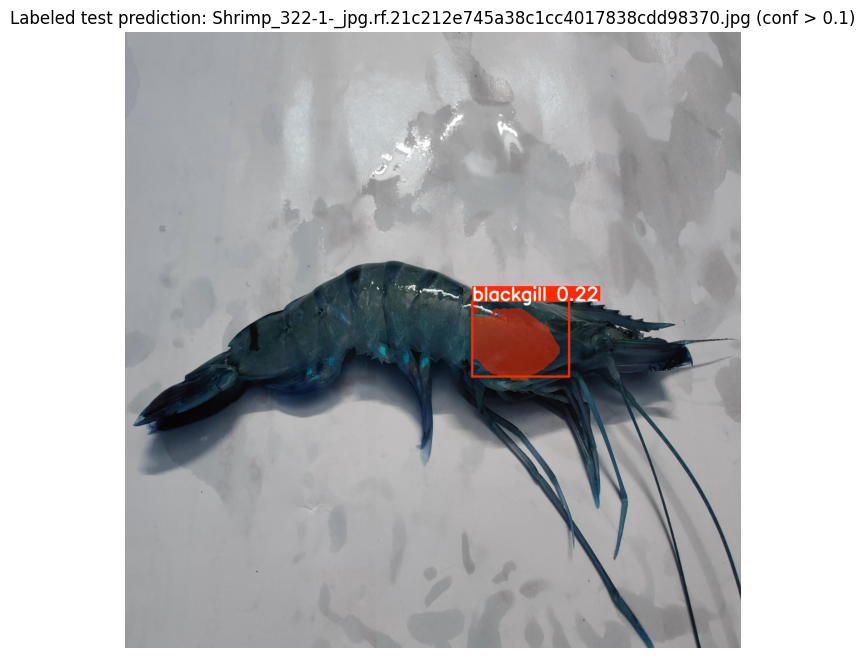

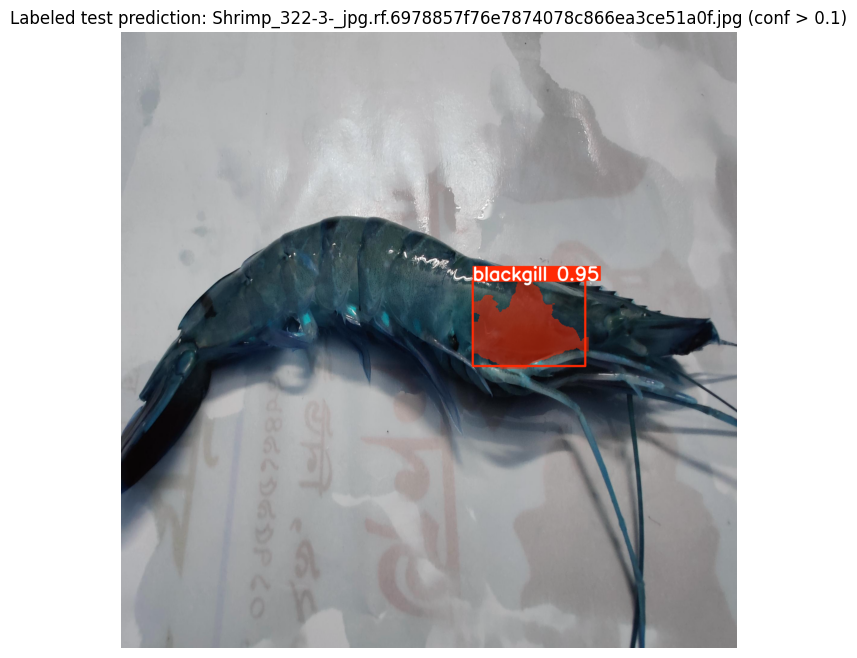

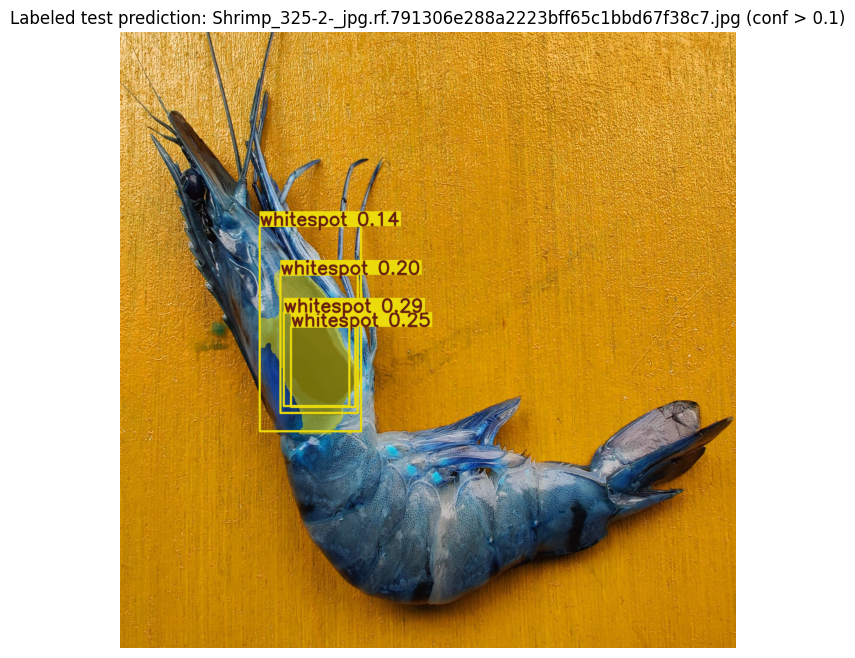

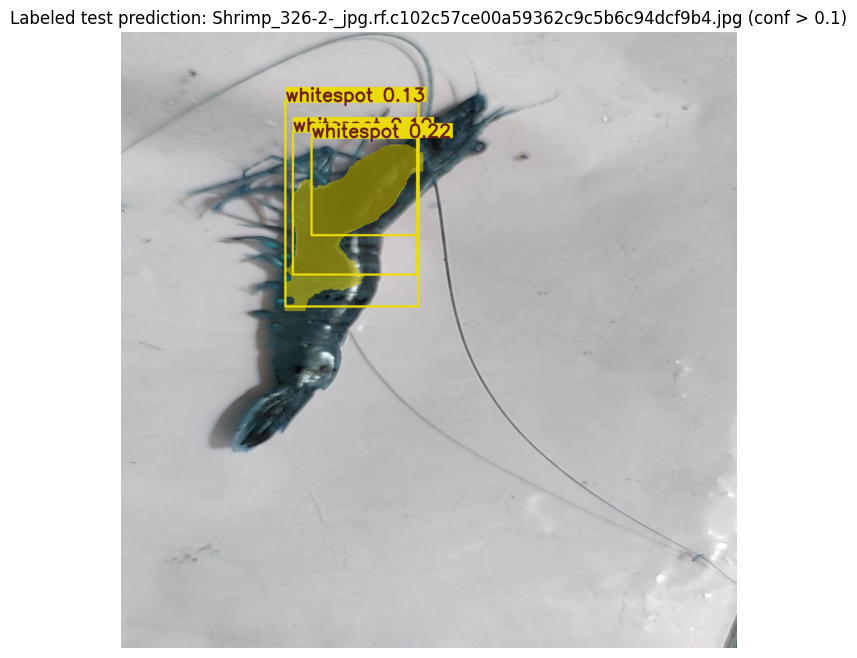

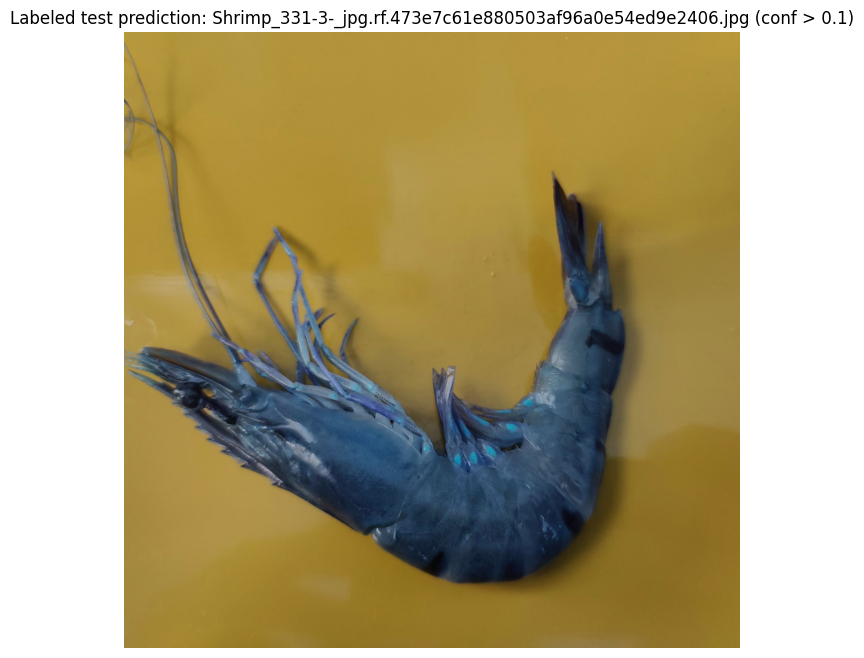

...

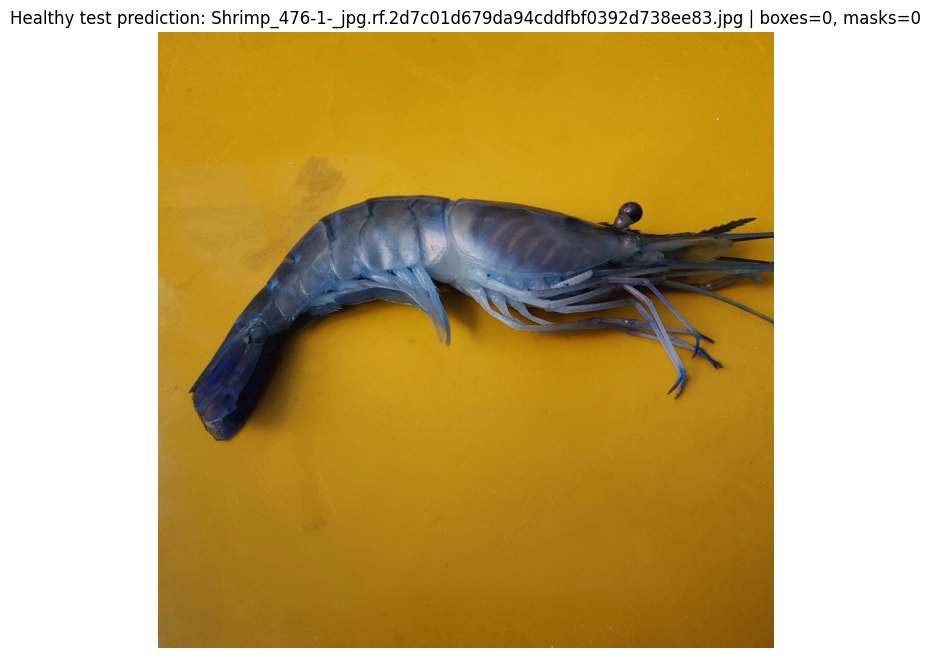

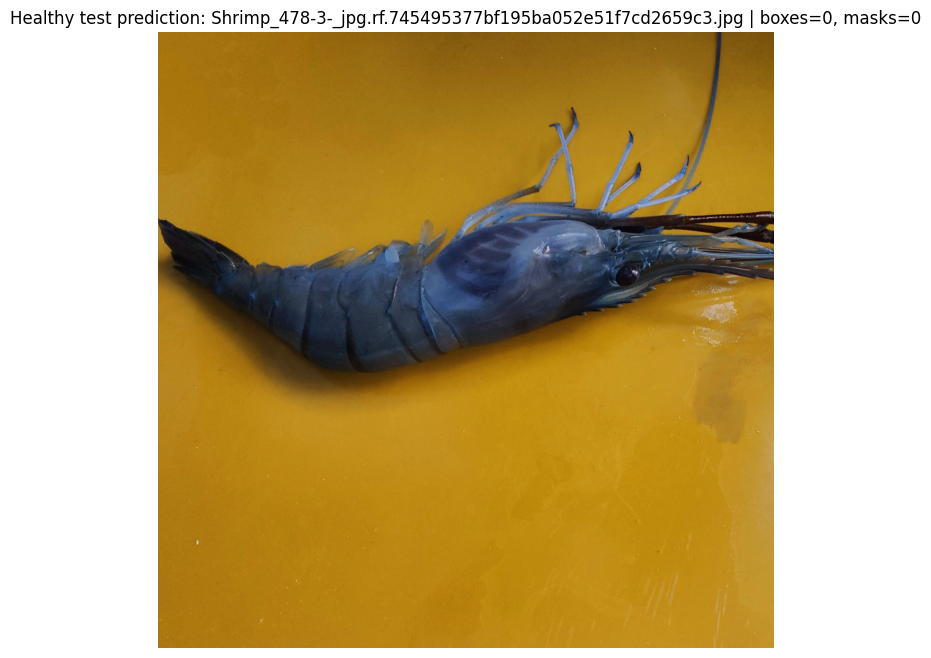

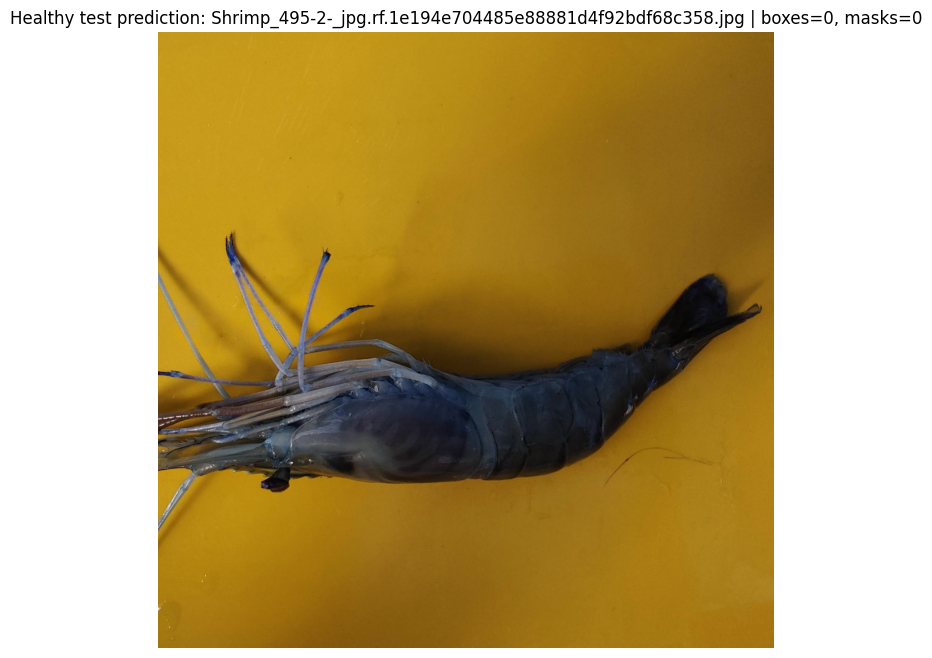

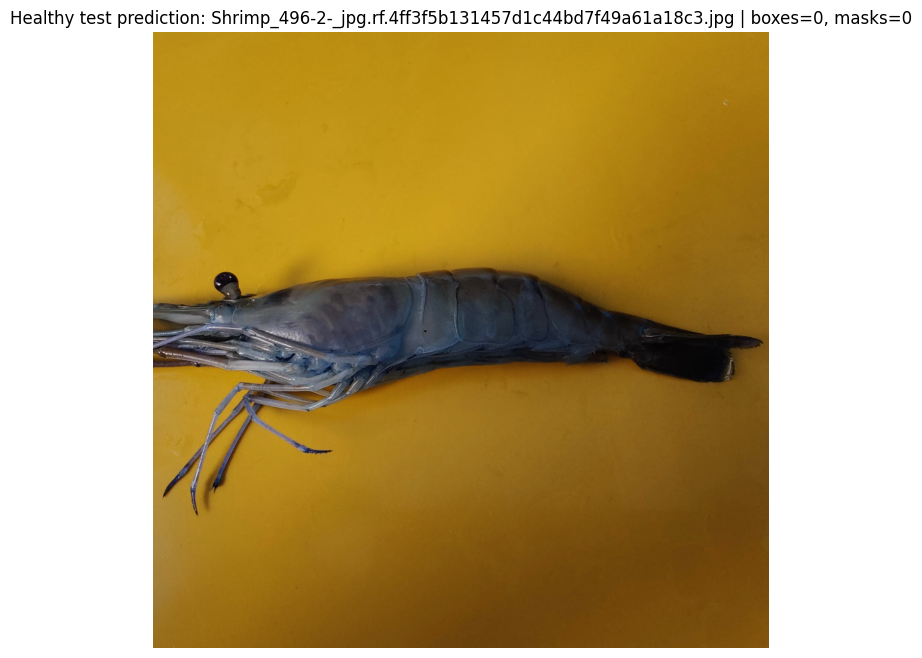

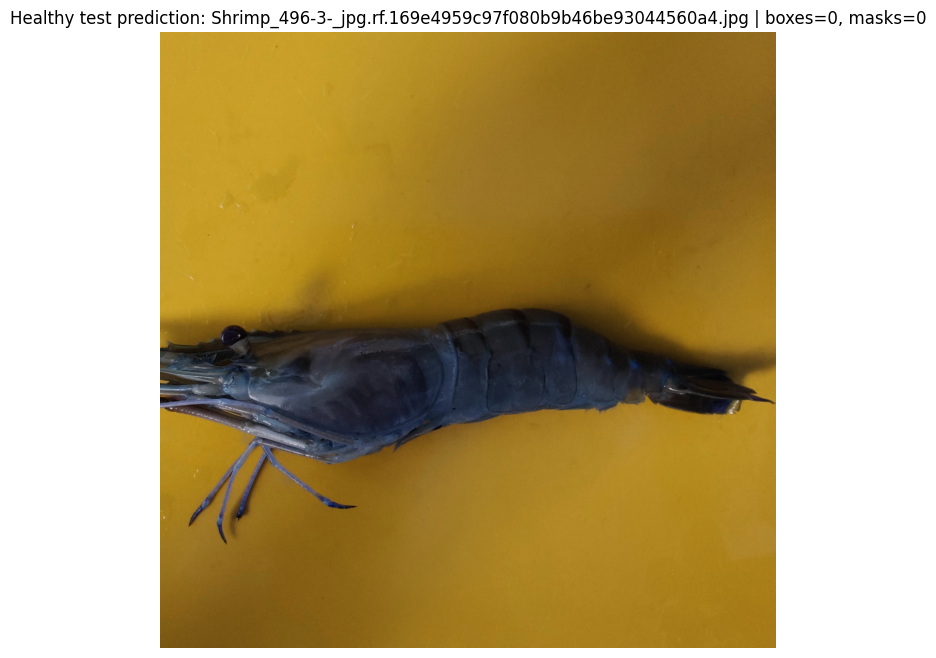

In [10]:
from ultralytics import YOLO
import glob
import matplotlib.pyplot as plt
import os
import random
import shutil
from pathlib import Path

import cv2
import numpy as np
import yaml

IMAGE_EXTENSIONS = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

COUNT_PENALTY_WEIGHT = 0.02
DISEASE_MISS_PENALTY_WEIGHT = 0.50
HEALTHY_FP_PENALTY_WEIGHT = 0.50


def metric_value(metrics, dotted_name, default=0.0):
    value = metrics
    try:
        for part in dotted_name.split('.'):
            value = getattr(value, part)
        return float(value)
    except Exception:
        return default


def healthy_false_positive_summary(model, image_dir, conf=0.25):
    image_dir = Path(image_dir)
    images = []
    for ext in IMAGE_EXTENSIONS:
        images.extend(image_dir.glob(f'*{ext}'))
    images = sorted(images)

    if not images:
        return {
            'healthy_image_count': 0,
            'healthy_mask_fp_rate': 0.0,
            'healthy_box_fp_rate': 0.0,
            'healthy_fp_masks_per_image': 0.0,
            'healthy_fp_boxes_per_image': 0.0,
        }

    results = model.predict(source=[str(p) for p in images], conf=conf, save=False, verbose=False)
    fp_mask_images = 0
    fp_box_images = 0
    total_masks = 0
    total_boxes = 0

    for result in results:
        mask_count = len(result.masks) if result.masks is not None else 0
        box_count = len(result.boxes) if result.boxes is not None else 0
        total_masks += mask_count
        total_boxes += box_count
        fp_mask_images += int(mask_count > 0)
        fp_box_images += int(box_count > 0)

    n = len(images)
    return {
        'healthy_image_count': n,
        'healthy_mask_fp_rate': fp_mask_images / n,
        'healthy_box_fp_rate': fp_box_images / n,
        'healthy_fp_masks_per_image': total_masks / n,
        'healthy_fp_boxes_per_image': total_boxes / n,
    }


def has_nonempty_label(label_path):
    return Path(label_path).exists() and bool(Path(label_path).read_text().strip())


def copy_eval_subset(source_dataset_dir, target_dataset_dir, keep_labeled):
    source_dataset_dir = Path(source_dataset_dir)
    target_dataset_dir = Path(target_dataset_dir)
    image_out = target_dataset_dir / 'test' / 'images'
    label_out = target_dataset_dir / 'test' / 'labels'
    image_out.mkdir(parents=True, exist_ok=True)
    label_out.mkdir(parents=True, exist_ok=True)

    copied = 0
    source_image_dir = source_dataset_dir / 'test' / 'images'
    source_label_dir = source_dataset_dir / 'test' / 'labels'

    for ext in IMAGE_EXTENSIONS:
        for image_path in source_image_dir.glob(f'*{ext}'):
            label_path = source_label_dir / f'{image_path.stem}.txt'
            labeled = has_nonempty_label(label_path)
            if labeled != keep_labeled:
                continue

            shutil.copy2(image_path, image_out / image_path.name)
            if label_path.exists():
                shutil.copy2(label_path, label_out / label_path.name)
            else:
                (label_out / f'{image_path.stem}.txt').write_text('')
            copied += 1

    return copied


def write_eval_yaml(source_yaml, target_yaml, target_dataset_dir):
    source_yaml = Path(source_yaml)
    target_yaml = Path(target_yaml)
    target_dataset_dir = Path(target_dataset_dir)
    with open(source_yaml, 'r') as f:
        cfg = yaml.safe_load(f)

    cfg['train'] = str(target_dataset_dir / 'test' / 'images')
    cfg['val'] = str(target_dataset_dir / 'test' / 'images')
    cfg['test'] = str(target_dataset_dir / 'test' / 'images')

    target_yaml.parent.mkdir(parents=True, exist_ok=True)
    with open(target_yaml, 'w') as f:
        yaml.safe_dump(cfg, f, sort_keys=False)
    return cfg


model_inference = YOLO(str(best_model_path))
selected_exp = BEST_RUN['experiment'] if 'BEST_RUN' in globals() else run_path.name
selected_dataset_dir = EXPERIMENT_ROOT / selected_exp / 'dataset' if 'EXPERIMENT_ROOT' in globals() and 'BEST_RUN' in globals() else Path('/content/ewu_shrimp_disease-1')
selected_yaml = selected_dataset_dir / 'data.yaml'
selected_labeled_dir = REPORT_DIR / 'dataset_labeled_only_eval'
selected_labeled_yaml = selected_labeled_dir / 'data_labeled_only.yaml'
selected_healthy_dir = REPORT_DIR / 'dataset_healthy_only_eval'
selected_healthy_yaml = selected_healthy_dir / 'data_healthy_only.yaml'

labeled_count = copy_eval_subset(selected_dataset_dir, selected_labeled_dir, keep_labeled=True)
healthy_count = copy_eval_subset(selected_dataset_dir, selected_healthy_dir, keep_labeled=False)
labeled_cfg = write_eval_yaml(selected_yaml, selected_labeled_yaml, selected_labeled_dir)
healthy_cfg = write_eval_yaml(selected_yaml, selected_healthy_yaml, selected_healthy_dir)
class_names = labeled_cfg.get('names', [])

print('Selected experiment:', selected_exp)
print('Selected dataset dir:', selected_dataset_dir)
print('Labeled-only test images:', labeled_count)
print('Healthy-only test images:', healthy_count)

print('Full test-set evaluation:')
full_test_metrics = model_inference.val(data=str(selected_yaml), split='test', imgsz=640, plots=True, verbose=False)
print('Labeled-only diseased test-set evaluation:')
labeled_test_metrics = model_inference.val(data=str(selected_labeled_yaml), split='test', imgsz=640, plots=False, verbose=False)
healthy_test_fp = healthy_false_positive_summary(model_inference, selected_healthy_dir / 'test' / 'images')

print('Full test mask mAP50:', metric_value(full_test_metrics, 'seg.map50'))
print('Labeled-only diseased test mask mAP50:', metric_value(labeled_test_metrics, 'seg.map50'))
print('Healthy test mask false-positive rate:', healthy_test_fp['healthy_mask_fp_rate'])
print('Healthy test false-positive masks per image:', healthy_test_fp['healthy_fp_masks_per_image'])


def draw_yolo_segmentation_labels(image_path, label_path):
    image = cv2.imread(str(image_path))
    if image is None:
        raise FileNotFoundError(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    height, width = image.shape[:2]
    overlay = image.copy()
    colors = [(255, 70, 70), (70, 180, 255), (90, 220, 120), (240, 180, 60)]

    if label_path.exists():
        for line in label_path.read_text().splitlines():
            parts = line.strip().split()
            if len(parts) < 7:
                continue
            cls_id = int(float(parts[0]))
            coords = np.array([float(v) for v in parts[1:]], dtype=np.float32).reshape(-1, 2)
            coords[:, 0] *= width
            coords[:, 1] *= height
            pts = coords.astype(np.int32)
            color = colors[cls_id % len(colors)]
            cv2.polylines(overlay, [pts], isClosed=True, color=color, thickness=2)
            cv2.fillPoly(overlay, [pts], color=color)
            x, y = pts[0]
            label = class_names[cls_id] if cls_id < len(class_names) else str(cls_id)
            cv2.putText(overlay, label, (int(x), int(y)), cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)

    return cv2.addWeighted(overlay, 0.35, image, 0.65, 0)


# Visualize augmented training ground-truth masks directly.
aug_images = sorted((selected_dataset_dir / 'train' / 'images').glob('aug_*'))
random.seed(42)
aug_images = random.sample(aug_images, k=min(6, len(aug_images)))

if aug_images:
    fig, axes = plt.subplots(len(aug_images), 1, figsize=(10, 5 * len(aug_images)))
    if len(aug_images) == 1:
        axes = [axes]
    for ax, image_path in zip(axes, aug_images):
        label_path = selected_dataset_dir / 'train' / 'labels' / f'{image_path.stem}.txt'
        ax.imshow(draw_yolo_segmentation_labels(image_path, label_path))
        ax.set_title(f'Augmented train GT mask: {image_path.name} | label exists={label_path.exists()}')
        ax.axis('off')
    plt.show()
else:
    print('No augmented training images found to visualize.')

# Visualize labeled test predictions.
test_images = []
for ext in IMAGE_EXTENSIONS:
    test_images.extend((selected_dataset_dir / 'test' / 'images').glob(f'*{ext}'))

def has_nonempty_test_label(image_path):
    label_path = selected_dataset_dir / 'test' / 'labels' / f'{image_path.stem}.txt'
    return label_path.exists() and bool(label_path.read_text().strip())

test_images = [p for p in sorted(test_images) if has_nonempty_test_label(p)]
test_images = test_images[:8]

results = model_inference.predict(source=[str(p) for p in test_images], conf=0.1, save=True, verbose=False)
for image_path, result in zip(test_images, results):
    plt.figure(figsize=(8, 8))
    plt.imshow(result.plot())
    plt.title(f'Labeled test prediction: {image_path.name} (conf > 0.1)')
    plt.axis('off')
    plt.show()

# Visualize healthy negative predictions to inspect false positives.
healthy_images = []
for ext in IMAGE_EXTENSIONS:
    healthy_images.extend((selected_healthy_dir / 'test' / 'images').glob(f'*{ext}'))
healthy_images = sorted(healthy_images)[:8]

if healthy_images:
    healthy_results = model_inference.predict(source=[str(p) for p in healthy_images], conf=0.1, save=False, verbose=False)
    for image_path, result in zip(healthy_images, healthy_results):
        plt.figure(figsize=(8, 8))
        plt.imshow(result.plot())
        box_count = len(result.boxes) if result.boxes is not None else 0
        mask_count = len(result.masks) if result.masks is not None else 0
        plt.title(f'Healthy test prediction: {image_path.name} | boxes={box_count}, masks={mask_count}')
        plt.axis('off')
        plt.show()
else:
    print('No healthy test images found to visualize.')


**Missed Box Metric**


In [11]:
from collections import Counter
from pathlib import Path
from PIL import Image
import torch
import yaml

MISS_SPLIT = "val"  # Change to "test" if needed.
MISS_IOU_THRESHOLD = 0.50
MISS_CONF_THRESHOLD = 0.25
IMAGE_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}


def class_name(names, class_id):
    if isinstance(names, dict):
        return names.get(class_id, names.get(str(class_id), str(class_id)))
    if isinstance(names, list) and class_id < len(names):
        return names[class_id]
    return str(class_id)


def image_label_path(image_path):
    image_path = Path(image_path)
    if image_path.parent.name == "images":
        return image_path.parent.parent / "labels" / f"{image_path.stem}.txt"
    return image_path.with_suffix(".txt")


def read_yolo_seg_boxes(label_path, image_path):
    if not Path(label_path).exists():
        return []

    width, height = Image.open(image_path).size
    boxes = []
    for line in Path(label_path).read_text().splitlines():
        parts = line.strip().split()
        if len(parts) < 5:
            continue

        cls = int(float(parts[0]))
        vals = [float(x) for x in parts[1:]]

        if len(vals) == 4:
            x, y, w, h = vals
            x1 = (x - w / 2) * width
            y1 = (y - h / 2) * height
            x2 = (x + w / 2) * width
            y2 = (y + h / 2) * height
        else:
            xs = vals[0::2]
            ys = vals[1::2]
            x1 = min(xs) * width
            y1 = min(ys) * height
            x2 = max(xs) * width
            y2 = max(ys) * height

        boxes.append({"cls": cls, "box": torch.tensor([x1, y1, x2, y2], dtype=torch.float32)})
    return boxes


def box_iou(box, boxes):
    if boxes.numel() == 0:
        return torch.empty(0)

    x1 = torch.maximum(box[0], boxes[:, 0])
    y1 = torch.maximum(box[1], boxes[:, 1])
    x2 = torch.minimum(box[2], boxes[:, 2])
    y2 = torch.minimum(box[3], boxes[:, 3])

    inter = (x2 - x1).clamp(min=0) * (y2 - y1).clamp(min=0)
    area1 = (box[2] - box[0]).clamp(min=0) * (box[3] - box[1]).clamp(min=0)
    area2 = (boxes[:, 2] - boxes[:, 0]).clamp(min=0) * (boxes[:, 3] - boxes[:, 1]).clamp(min=0)
    return inter / (area1 + area2 - inter + 1e-9)


with open(DATA_YAML, "r") as f:
    data_cfg = yaml.safe_load(f)

split_source = Path(data_cfg.get(MISS_SPLIT, ""))
if not split_source.is_absolute():
    split_source = Path(DATA_YAML).parent / split_source

image_paths = sorted(p for p in split_source.rglob("*") if p.suffix.lower() in IMAGE_EXTS)

pred_results = best_model.predict(
    source=[str(p) for p in image_paths],
    imgsz=640,
    conf=MISS_CONF_THRESHOLD,
    iou=0.5,
    device=0,
    save=False,
    verbose=False,
)

gt_by_class = Counter()
missed_by_class = Counter()
total_gt = 0
total_missed = 0

for image_path, result in zip(image_paths, pred_results):
    gt_items = read_yolo_seg_boxes(image_label_path(image_path), image_path)
    total_gt += len(gt_items)

    if result.boxes is None or len(result.boxes) == 0:
        pred_boxes = torch.empty((0, 4), dtype=torch.float32)
        pred_classes = torch.empty((0,), dtype=torch.long)
    else:
        pred_boxes = result.boxes.xyxy.detach().cpu().float()
        pred_classes = result.boxes.cls.detach().cpu().long()

    matched_pred = set()
    for gt in gt_items:
        gt_cls = gt["cls"]
        gt_by_class[gt_cls] += 1
        candidates = [
            i for i, pred_cls in enumerate(pred_classes.tolist())
            if pred_cls == gt_cls and i not in matched_pred
        ]

        matched = False
        if candidates:
            candidate_boxes = pred_boxes[candidates]
            ious = box_iou(gt["box"], candidate_boxes)
            best_iou, best_local_idx = torch.max(ious, dim=0)
            if float(best_iou) >= MISS_IOU_THRESHOLD:
                matched_pred.add(candidates[int(best_local_idx)])
                matched = True

        if not matched:
            missed_by_class[gt_cls] += 1
            total_missed += 1

detected_gt = total_gt - total_missed

print("Missed-box split:", MISS_SPLIT)
print("Total GT boxes:", total_gt)
print("Detected GT boxes:", detected_gt)
print("Missed GT boxes:", total_missed)
print("Missed-box rate:", total_missed / total_gt if total_gt else 0.0)
print("Box recall by count:", detected_gt / total_gt if total_gt else 0.0)

print("\nMissed boxes by class:")
for cls_id in sorted(gt_by_class):
    gt_count = gt_by_class[cls_id]
    missed_count = missed_by_class[cls_id]
    print(
        f"  {class_name(data_cfg.get('names', best_model.names), cls_id)}: "
        f"missed {missed_count}/{gt_count} "
        f"({missed_count / gt_count if gt_count else 0.0:.4f})"
    )


Missed-box split: val
Total GT boxes: 109
Detected GT boxes: 24
Missed GT boxes: 85
Missed-box rate: 0.7798165137614679
Box recall by count: 0.22018348623853212

Missed boxes by class:
  blackgill: missed 4/8 (0.5000)
  whitespot: missed 81/101 (0.8020)


**Visualize Predictions**


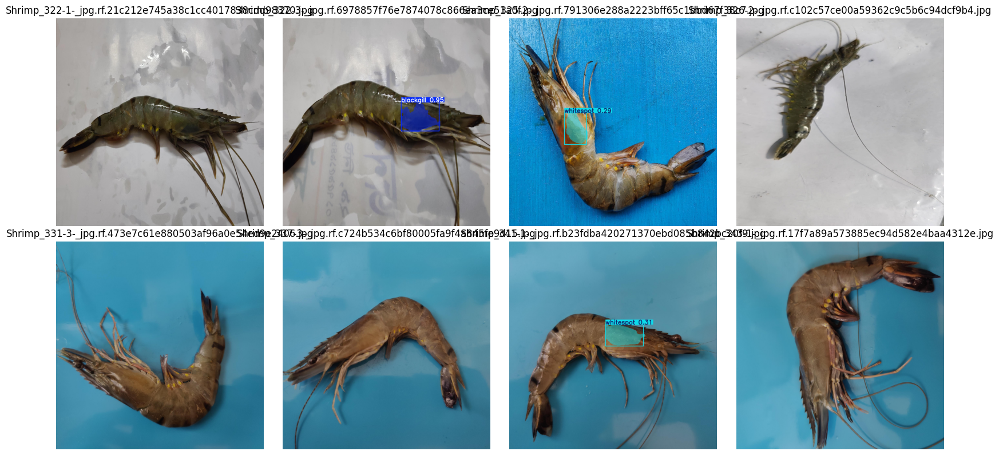

In [12]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

predict_dir = Path("/content/runs/predict_shrimp_cbam/cbam_predict")
image_exts = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}
images = sorted([p for p in predict_dir.rglob("*") if p.suffix.lower() in image_exts]) if predict_dir.exists() else []

if not images:
    print(f"No prediction images found in {predict_dir}")
else:
    show_images = images[:8]
    cols = min(4, len(show_images))
    rows = (len(show_images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
    axes = [axes] if len(show_images) == 1 else axes.flatten()

    for ax, img_path in zip(axes, show_images):
        ax.imshow(Image.open(img_path))
        ax.set_title(img_path.name)
        ax.axis("off")

    for ax in axes[len(show_images):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
